# Preparing tables. 

The results from a simulations can be displayed in formated tables in jupyter notebook and in latex. Below is an simple example. Also the results can be exported to excel for further processing. 

:::{index} single: Table in latex
:::

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')


In [3]:
# Prepare the notebook for use of modelflow 

# Jupyter magic command to improve the display of charts in the Notebook
%matplotlib inline

# Import pandas 
import pandas as pd

# Import the model class from the modelclass module 
from modelclass import model 
from modelreport import DisplayVarTableDef, DisplayDef, LatexRepo 
from modelreport import Line, Options,DisplaySpec,DisplayFigWrapDef, DisplayKeepFigDef

# functions that improve rendering of modelflow outputs
model.widescreen()
model.scroll_off()

<IPython.core.display.Javascript object>

## Load model and run an experiment with increased carbon tax

In [4]:
mpak,_ = model.modelload(r'..\models\pak.pcim',run=1,start=2023,end=2100,keep='Baseline')

file read:  ..\models\pak.pcim
invalid index to scalar variable.


In [5]:
update_variables = {'Carbon tax on Coal (USD/Ton)'       :'PAKGGREVCO2CER',
                    'Carbon tax on Oil (USD/Ton'         :'PAKGGREVCO2OER',
                    'Carbon tax on Natural Gas (USD/Ton' :'PAKGGREVCO2GER'}

for tax in [10,30]:
    alternative_exo =  mpak.basedf.upd(f'<2023 2050> PAKGGREVCO2CER PAKGGREVCO2OER PAKGGREVCO2GER = {tax}' )       
    res= mpak(alternative_exo,2023,2029,keep = f'Tax set to {tax}') #runs the solutiona nd saves it with the name to teh left

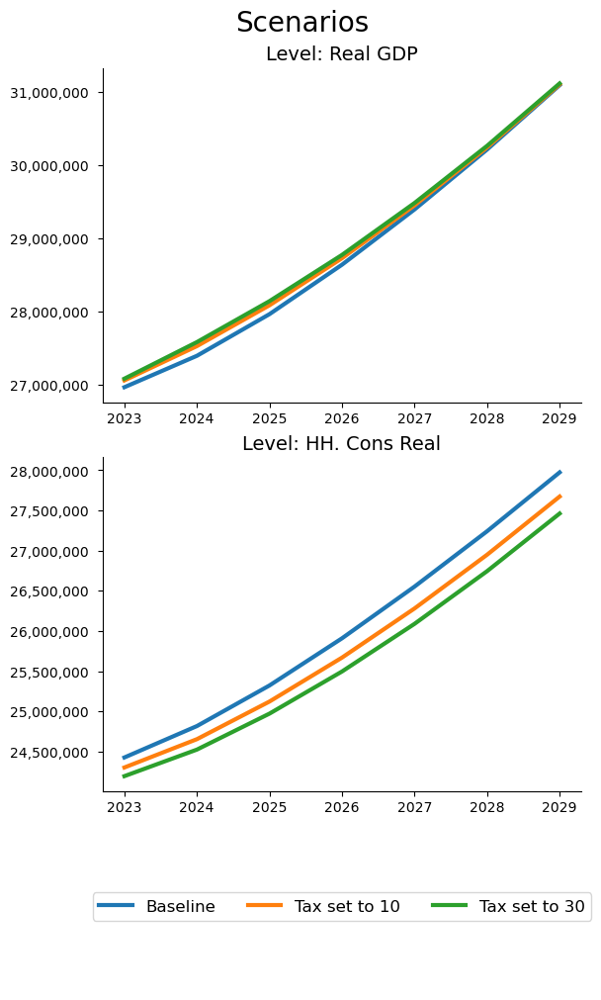

In [6]:
figs = mpak.keep_plot('*NYGDPMKTPKN *NECONPRVTKN ',samefig=True, legend=True, 
                    keep_dim=True,size=(6,5),ncol=1)

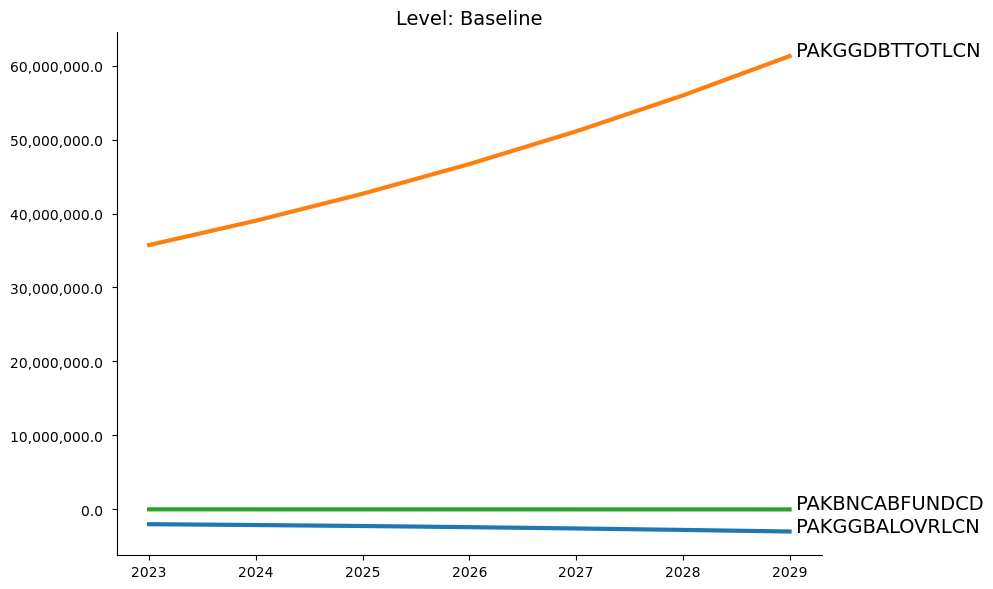

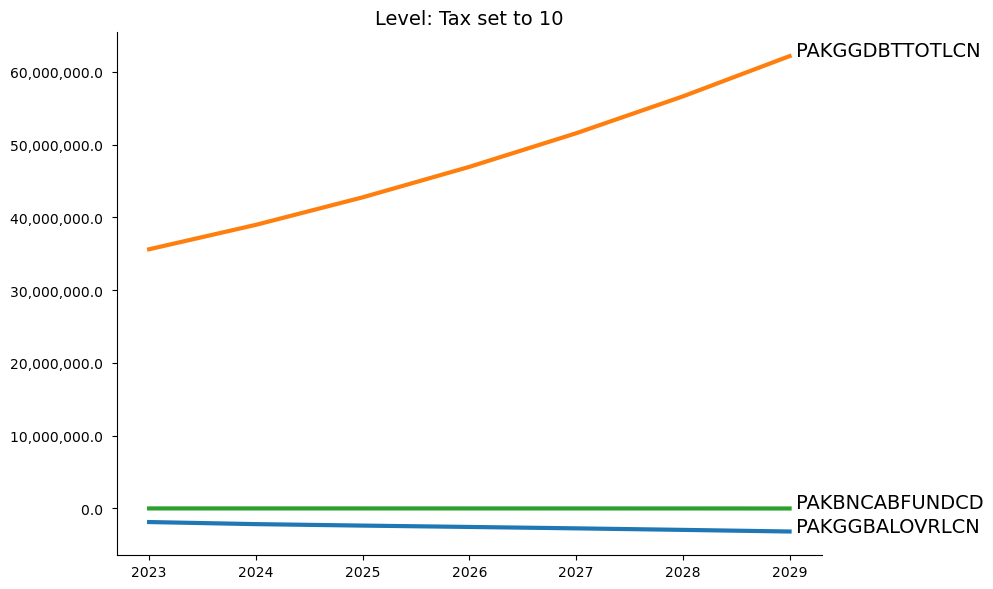

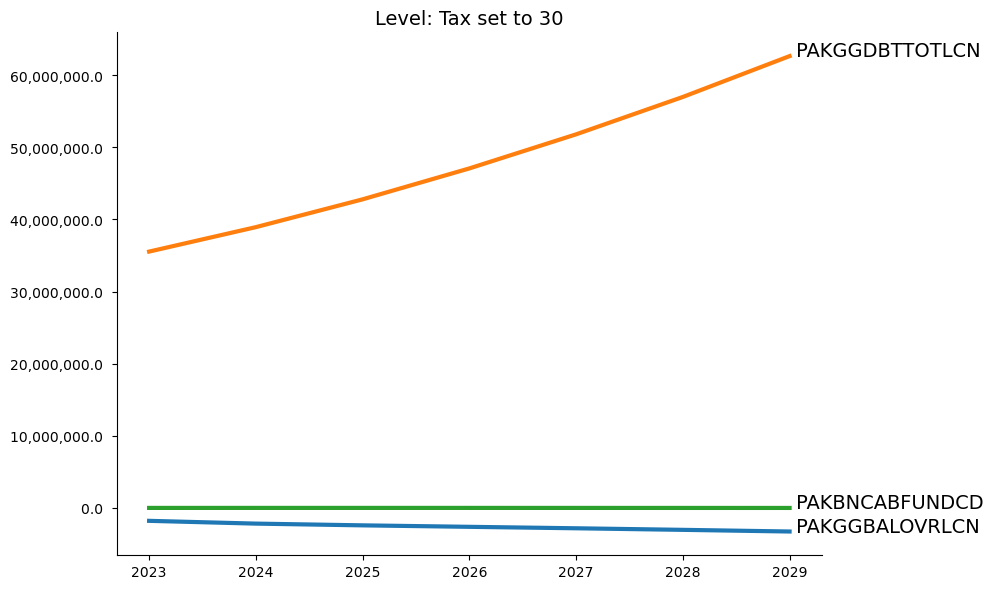

In [19]:
pat_na  = '*NYGDPMKTPKN *NECONPRVTKN  *NEGDIFTOTKN *NEEXPGNFSKN *NEIMPGNFSKN'
pat_gow = '*GGBALOVRLCN *GGDBTTOTLCN *BNCABFUNDCD'
custom_description    = {'PAKNYGDPMKTPKN':'GDP'}

tabspec = DisplaySpec(
    options = Options(decorate=False,rename=True,name='Test_charts',
                      custom_description=custom_description,title = 'Ibs test',
                     max_cols=6,last_cols= 2,samefig=False,legend=True),
    lines = [           
         #Line(showtype='gdppct',pat= pat_gow,dec= 1),
         Line(showtype='level',pat= pat_gow,dec= 1,diftype='basedf',keep_dim=False),
         #Line(showtype='growth',pat= pat_na,dec= 1,keep_dim=False,rename = True)
    ]
)

fig = DisplayKeepFigDef (mmodel=mpak, spec = tabspec+Options(legend=False,rename=False))


#fig.dfs

#fig


In [16]:
fig.pdf() 